In [18]:
# %%
"""
03_scene_clip.ipynb – klasyfikacja typu sceny przy użyciu CLIP (zero-shot).
"""

from pathlib import Path
from datetime import datetime, timezone
from contextlib import nullcontext
import time
import json

import numpy as np
import pandas as pd
from PIL import Image

import torch
import open_clip
import matplotlib.pyplot as plt

# %%
"""
Ustawienia urządzenia i precyzji FP16.
"""

def get_device() -> torch.device:
    """
    Wybiera urządzenie obliczeniowe.

    Preferencja: MPS → CUDA → CPU.
    """
    if torch.backends.mps.is_available():
        return torch.device("mps")
    if torch.cuda.is_available():
        return torch.device("cuda")
    return torch.device("cpu")


device = get_device()
IMG_DTYPE = torch.float16 if device.type in ("cuda", "mps") else torch.float32
TEXT_DTYPE = IMG_DTYPE

print("Device:", device, "| IMG_DTYPE:", IMG_DTYPE)

# %%
"""
Ścieżki wejścia/wyjścia dla klasyfikacji scen.
"""

PROJECT_ROOT = Path(".").resolve()
DIR_DATA = PROJECT_ROOT / "data"
DIR_STAGING = DIR_DATA / "test_scenes"
DIR_OUT = PROJECT_ROOT / "outputs"
DIR_OUT.mkdir(parents=True, exist_ok=True)

CSV_PATH = DIR_OUT / "scene_clip_results.csv"

LOGS_DIR = PROJECT_ROOT / "logs"
LOGS_DIR.mkdir(parents=True, exist_ok=True)
RUNLOG_PATH = LOGS_DIR / "runlog.jsonl"

print("Wejście (obrazy):", DIR_STAGING)
print("Wyjście (CSV):   ", CSV_PATH)


Device: mps | IMG_DTYPE: torch.float16
Wejście (obrazy): /Users/olga/MetaLogic/data/test_scenes
Wyjście (CSV):    /Users/olga/MetaLogic/outputs/scene_clip_results.csv


In [19]:

# %%
"""
Ładowanie modelu CLIP z biblioteki open_clip_torch.
"""

MODEL_NAME = "ViT-B-32"
PRETRAINED = "laion2b_s34b_b79k"


def load_clip_model(
    model_name: str = MODEL_NAME,
    pretrained: str = PRETRAINED,
    device: torch.device = device,
    dtype: torch.dtype = IMG_DTYPE,
):
    """
    Ładuje model CLIP i tokenizer open_clip w zadanej precyzji.

    model_name – nazwa architektury, np. "ViT-B-32"
    pretrained – wariant pretrenowany z open_clip
    device     – torch.device ("mps", "cuda" lub "cpu")
    dtype      – torch.dtype (torch.float16 lub torch.float32)
    """
    model, _, preprocess = open_clip.create_model_and_transforms(
        model_name,
        pretrained=pretrained,
        device=device,
    )
    model = model.to(device=device, dtype=dtype)
    tokenizer = open_clip.get_tokenizer(model_name)
    return model, tokenizer, preprocess


model, tokenizer, preprocess = load_clip_model()
model.eval();

# %%

# %%
"""
Definicja etykiet scen i promptów tekstowych.

Używamy listy krotek (etykieta_PL, prompt_EN),
tak jak w Twojej wersji.
"""

# Lista promptów (etykieta_PL, prompt_EN)
LABEL_TO_PROMPT = [
    ("plac miejski", "city square"),
    ("targowisko lub rynek", "street market"),
    ("fabryka lub zakład przemysłowy", "factory exterior"),
    ("demonstracja uliczna", "street protest"),
    ("blokowisko lub osiedle mieszkaniowe", "apartment block area"),
    ("komunikacja miejska", "public transport in the city"),
    ("scena wiejska", "rural countryside scene"),
    ("pola i gospodarstwa", "farmland landscape"),
    ("droga wiejska", "country road"),
    ("wieś z zabudową tradycyjną", "village street"),
    ("wnętrze mieszkania", "interior of a flat"),
    ("wnętrze biura lub instytucji", "office or institutional interior"),
    ("wnętrze sklepu", "shop interior"),
    ("wnętrze zakładu pracy", "factory interior"),
    ("portret jednej osoby", "portrait of one person"),
    ("grupa ludzi w pomieszczeniu", "group of people indoors"),
    ("tłum na wydarzeniu wewnątrz", "crowd of people at an indoor event"),
    ("grupa ludzi na zewnątrz", "group of people outdoors"),
    ("tłum na ulicy", "crowd of people on the street"),
    ("uroczystość lub wydarzenie publiczne", "public ceremony or event"),
    ("park lub zieleń miejska", "city park"),
    ("krajobraz naturalny bez zabudowań", "natural landscape without buildings"),
    ("jezioro lub rzeka", "lake or river scene"),
    ("plac budowy", "construction site"),
    ("lotnisko lub dworzec", "airport or train station"),
    ("plac zabaw lub boisko sportowe", "playground or sports field"),
    ("restauracja lub kawiarnia", "restaurant or cafe interior"),
    ("auto", "car exterior"),
    ("autobus lub tramwaj", "bus or tram exterior"),
    ("pociąg", "train exterior"),
    ("samolot", "airplane exterior"),
    ("balon", "hot air balloon exterior"),
    ("rowery lub motocykle", "bicycles or motorcycles"),
    ("ulica w starej części miasta", "old town street"),
    ("kamienice lub zabytkowe budynki", "historic buildings or tenements"),
    ("nowoczesne budynki lub wieżowce", "modern buildings or skyscrapers"),
    ("bloki z welkiej płyty", "prefabricated apartment blocks"),
    ("ulica w słoneczny dzień", "street on a sunny day"),
    ("ulica o zmierzchu", "street at dusk"),
    ("ulica w deszczu", "street in the rain"),
    ("ulica nocą", "street at night"),
    ("słoneczna pogoda", "sunny weather scene"),
    ("pochmurna pogoda", "cloudy weather scene"),
    ("śnieżna pogoda", "snowy weather scene"),
    ("wózki dziecięce lub place zabaw", "strollers or playgrounds"),
    ("zwierzęta domowe lub zwierzęta na ulicy", "pets or street animals"),
    ("instrumenty muzyczne lub występy uliczne", "musical instruments or street performances"),
    ("studio nagrań lub plan filmowy", "recording studio or film set"),
    ("studio muzyczne", "music studio interior"),
    ("pomniki lub rzeźby miejskie", "monuments or urban sculptures"),
    ("mosty lub wiadukty", "bridges or viaducts"),
    ("fontanny lub miejskie zbiorniki wodne", "fountains or urban water features"),
    ("plakat uliczny", "street poster on a wall or door"),
    ("napisy lub hasła na murach", "graffiti or political slogans on walls"),
    ("szyldy sklepowe lub reklamy uliczne", "shop signs or street advertisements"),
    ("papierosy lub palenie na ulicy", "cigarettes or street smoking"),
]

# etykiety PL i prompty EN wyciągamy z listy:
SCENE_LABELS = [pl for (pl, en) in LABEL_TO_PROMPT]
PROMPTS = [en for (pl, en) in LABEL_TO_PROMPT]

print("Liczba etykiet scen:", len(SCENE_LABELS))


Liczba etykiet scen: 56


In [20]:
# %%
"""
Obliczanie embeddingów tekstowych CLIP dla promptów scen.
"""

@torch.no_grad()
def encode_text_prompts(
    model,
    tokenizer,
    prompts,
    device: torch.device,
    dtype: torch.dtype,
) -> torch.Tensor:
    """
    Koduje listę promptów tekstowych do embeddingów CLIP.

    model   – model CLIP
    tokenizer – tokenizer CLIP
    prompts – lista tekstów (str)
    device  – torch.device
    dtype   – torch.dtype (np. torch.float16)
    """
    tokens = tokenizer(prompts)
    tokens = tokens.to(device)

    if device.type in ("cuda", "mps") and dtype == torch.float16:
        autocast_ctx = torch.autocast(device_type=device.type, dtype=dtype)
    else:
        autocast_ctx = nullcontext()

    with autocast_ctx:
        text_features = model.encode_text(tokens)

    text_features = text_features / text_features.norm(dim=-1, keepdim=True)
    return text_features.to(device=device, dtype=dtype)


TEXT_FEATURES = encode_text_prompts(
    model=model,
    tokenizer=tokenizer,
    prompts=PROMPTS,
    device=device,
    dtype=TEXT_DTYPE,
)

TEXT_FEATURES.shape



torch.Size([56, 512])

In [21]:
# %%
"""
Pomocnicze funkcje do wczytywania obrazów i iteracji po folderze.
"""

def list_images(root: Path):
    """
    Zwraca listę ścieżek do obrazów (jpg/jpeg/png/tif/tiff) w katalogu root (rekurencyjnie).

    root – katalog startowy (Path)
    """
    exts = {".jpg", ".jpeg", ".png", ".tif", ".tiff"}
    return [p for p in root.rglob("*") if p.suffix.lower() in exts]


def load_image(path: Path) -> Image.Image:
    """
    Wczytuje obraz jako obiekt PIL.Image w trybie RGB.

    path – ścieżka do pliku graficznego
    """
    img = Image.open(path)
    return img.convert("RGB")



In [22]:
@torch.no_grad()
def classify_image_scene(
    path: Path,
    model,
    preprocess,
    text_features: torch.Tensor,
    device: torch.device,
    dtype: torch.dtype,
):
    """
    Klasyfikuje typ sceny dla pojedynczego obrazu przy użyciu CLIP.
    """
    img = load_image(path)
    image_input = preprocess(img).unsqueeze(0).to(device=device, dtype=dtype)

    if device.type in ("cuda", "mps") and dtype == torch.float16:
        autocast_ctx = torch.autocast(device_type=device.type, dtype=dtype)
    else:
        autocast_ctx = nullcontext()

    with autocast_ctx:
        image_features = model.encode_image(image_input)

    # normalizacja
    image_features = image_features / image_features.norm(dim=-1, keepdim=True)

    # oryginalne skalowanie CLIP
    logit_scale = model.logit_scale.exp()
    logits = (image_features @ text_features.T) * logit_scale

    probs = logits.softmax(dim=-1)
    top_score, top_idx = probs.max(dim=-1)
    return int(top_idx), float(top_score.cpu())

In [ ]:
# %%
"""
Główna pętla: klasyfikacja wszystkich obrazów w katalogu wejściowym.
"""

IN_DIR = DIR_STAGING / "test_scenes"  # w razie potrzeby podmień np. na DIR_STAGING / "test_scenes"

image_paths = list_images(IN_DIR)
print("Liczba znalezionych obrazów:", len(image_paths))

results = []
t0 = time.time()

for path in image_paths:
    idx, score = classify_image_scene(
        path=path,
        model=model,
        preprocess=preprocess,
        text_features=TEXT_FEATURES,
        device=device,
        dtype=IMG_DTYPE,
    )
    label = SCENE_LABELS[idx]

    results.append(
        {
            "file_path": str(path.relative_to(PROJECT_ROOT)),
            "scene_label": label,
            "score": score,
        }
    )

dt = time.time() - t0
if len(results) > 0:
    print(f"Przetworzono {len(results)} obrazów w {dt:.1f} s ({len(results) / dt:.2f} img/s).")

df = pd.DataFrame(results)
df.head()

# %%
"""
Zapis wyników klasyfikacji scen do CSV i runlog.jsonl.
"""

timestamp = datetime.now(timezone.utc).isoformat()
df["timestamp"] = timestamp
df.to_csv(CSV_PATH, index=False)
print("Zapisano wyniki do:", CSV_PATH)

runlog_entry = {
    "timestamp": timestamp,
    "step": "scene_clip",
    "n_images": int(len(df)),
    "csv_path": str(CSV_PATH),
    "model_name": MODEL_NAME,
    "pretrained": PRETRAINED,
    "device": str(device),
    "dtype": str(IMG_DTYPE),
}

with RUNLOG_PATH.open("a", encoding="utf-8") as f:
    f.write(json.dumps(runlog_entry, ensure_ascii=False) + "\n")

print("Dopisano wpis do:", RUNLOG_PATH)



Liczba znalezionych obrazów: 271
Przetworzono 271 obrazów w 33.6 s (8.06 img/s).
Zapisano wyniki do: /Users/olga/MetaLogic/outputs/scene_clip_results.csv
Dopisano wpis do: /Users/olga/MetaLogic/logs/runlog.jsonl


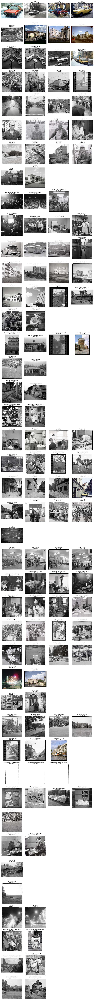

In [27]:
# %%
"""
Podgląd miniatur pogrupowanych wg etykiet sceny
– deduplikacja po nazwie pliku,
– nad każdą miniaturą: etykieta z LABEL_TO_PROMPT + nazwa pliku.
"""

N_PER_LABEL = 4
MAX_LABELS = None  # None = wszystkie etykiety


def show_thumbnails_by_label(
    df: pd.DataFrame,
    project_root: Path,
    max_labels: int | None = MAX_LABELS,
    n_per_label: int = N_PER_LABEL,
):
    """
    Rysuje miniatury obrazów pogrupowanych wg etykiet sceny.

    df           – DataFrame z kolumnami 'file_path', 'scene_label', 'score'
    project_root – katalog bazowy repozytorium
    max_labels   – maksymalna liczba etykiet do pokazania (None = wszystkie)
    n_per_label  – maksymalna liczba obrazów na etykietę
    """
    df = df.copy()
    df["filename"] = df["file_path"].apply(lambda p: Path(p).name)
    # deduplikacja: jeden wiersz na (kategoria, nazwa pliku)
    df = df.drop_duplicates(subset=["scene_label", "filename"])

    labels_all = df["scene_label"].unique()
    labels = labels_all if max_labels is None else labels_all[:max_labels]

    n_rows = len(labels)
    if n_rows == 0:
        print("Brak wyników do wyświetlenia.")
        return

    n_cols = n_per_label
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 3 * n_rows))

    if n_rows == 1:
        axes = np.array([axes])

    for row, label in enumerate(labels):
        subset = (
            df[df["scene_label"] == label]
            .sort_values("score", ascending=False)
            .head(n_per_label)
        )

        for col in range(n_cols):
            ax = axes[row, col]
            ax.axis("off")

            if col >= len(subset):
                continue

            rec = subset.iloc[col]
            img_path = project_root / rec["file_path"]
            img = load_image(img_path)
            filename = rec["filename"]

            ax.imshow(img)
            # etykieta sceny (LABEL_TO_PROMPT) + nazwa pliku
            ax.set_title(f"{label}\n{filename}", fontsize=8)

    plt.tight_layout()
    plt.show()


show_thumbnails_by_label(df, PROJECT_ROOT)